# **Análise Exploratória de Dados E-Commerce**

## Descrição e Objetivo

Nesse projeto de análise de dados, será feito um exercicio para praticar habilidades analíticas e exploratórias em um dataset de E-Commerce para entender o comportamento dos dados, tendências, correlação entre variáveis e identificar padrões que possam fornecer insights valiosos sobre o desempenho das vendas, preferências dos clientes e possíveis oportunidades de otimização. Os resultados da análise serão apresentados por meio de visualizações gráficas, permitindo uma melhor interpretação dos dados e facilitando a extração de insights estratégicos.

Antes de prosseguir para extração dos dados, vamos definir um contexto para o business case e algumas perguntas de problema de negócio utilizando o Copilot, que vai interpretar o meu metadados e entregar todo o problema estruturado para servir como guia ao longo da análise explorátoria.

## Problema de Negócio ##
O principal problema de negócio abordado nesta análise é entender o **comportamento dos clientes** e o **desempenho dos produtos** para melhorar estratégias de vendas, precificação e experiência do consumidor.

## Solicitação da Análise ##
A análise foi solicitada pelo time de Business Intelligence (BI) da empresa, com o objetivo de fornecer informações estratégicas para a tomada de decisão baseada em dados. A principal audiência inclui:

**Equipe de Marketing:** Para entender o perfil dos clientes e suas preferências

**Gestores de Produção:** Para avaliar o desempenho dos produtos com base em avaliações e histórico de compras.

**Equipe de Vendas** Para segmentação de mercado e ajuste de campanhas promocionais.

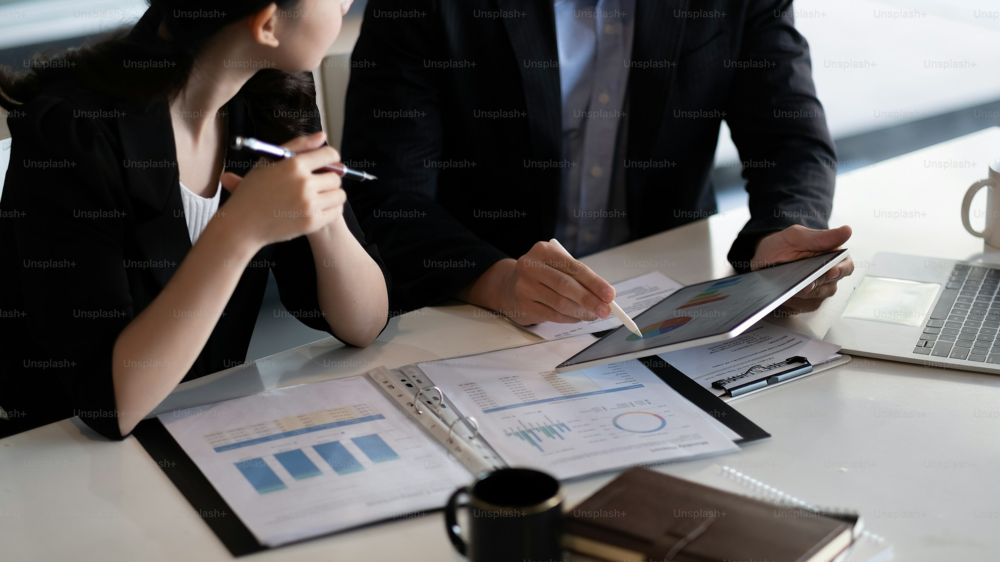

In [1]:
from IPython.display import Image
Image(r"image\business_image.png")

## Perguntas de Negócio ##

1. Quais são as faixas etárias dos clientes mais ativos no e-commerce? **(Gráfico de barras para distribuição etária dos clientes)**

2. Qual é a distribuição de gênero entre os clientes? Existe diferença no comportamento de compra entre eles? **(Boxplot comparando o número de compras por gênero).**

3. Como a faixa de preço dos produtos varia entre diferentes categorias e subcategorias? **(Gráfico de colunas para visualizar a variação de preços).**

4. Existe correlação entre preço e avaliação dos produtos? **(Gráfico de Dispersão para visualizar a relação entre Preço e Nota_Avaliação).**

5. Como os sentimentos das avaliações estão distribuídos entre os produtos? **(Gráfico de barras empilhado para comparar a Revisão de Sentimento entre categorias e subcategorias de produtos).**

## Metadados ##

Este conjunto de dados sintético representa dados de produtos de comércio eletrônico.
Cada registro inclui as seguintes variáveis:

**Product_ID:** Um identificador exclusivo para cada produto.

**Product_Name:** Um nome que descreve o produto (por exemplo, "Mouse sem fio", "Smartphone"), gerado de acordo com sua categoria.

**Category:** a categoria ampla à qual o produto pertence (por exemplo, "Eletrônicos", "Roupas", "Móveis").

**Sub_Category:** Uma subcategoria específica dentro da categoria principal (por exemplo, "Telefones celulares" em "Eletrônicos").

**Price:** O preço do produto, que varia de acordo com sua categoria.

**Customer_Age:** A idade de um cliente que pode comprar o produto, variando de 18 a 65 anos.

**Customer_Gender:** O sexo do cliente ("Masculino" ou "Feminino").

**Purchase_History:** Uma contagem simulada do número de compras feitas pelo cliente, influenciada por sua idade e categoria de produto.

**Review_Rating:** Uma classificação dada ao produto, com base em seu preço, variando de 1 a 5 estrelas.

**Review_Sentiment:** o sentimento da avaliação, que pode ser "Negativo", "Neutro", "Positivo" ou "Muito Positivo", com base no preço.

O conjunto de dados simula as interações com o cliente de uma plataforma de comércio eletrônico, fornecendo insights realistas para tarefas de aprendizado de máquina, como sistemas de recomendação, segmentação de clientes ou previsão de preços.


[Link do Dataset de E-Commerce via Kaggle](https://www.kaggle.com/datasets/gazal5277/e-commerce-product-and-customer-dataset/data)

# **Extração, Verificação e Transformação dos Dados**

In [2]:
# Importando Bibliotecas para Manipulação de Dados

import numpy as np
import pandas as pd

# Importando Bibliotecas para Visualização de Dados

import matplotlib.pyplot as plt
import seaborn as sbn

import warnings
warnings.filterwarnings('ignore')

In [3]:
# Primeiro, vamos começar extraindo os dados!
df = pd.read_csv(r"refined_ecommerce_product_data.csv", header=0)
df.head()

,Product_ID,Product_Name,Category,Sub_Category,Price,Customer_Age,Customer_Gender,Purchase_History,Review_Rating,Review_Sentiment
0,P0001,Sweater,Clothing,Pants,38.44,58,Male,16,2,Negative
1,P0002,Dining Table,Furniture,Chair,408.46,53,Female,4,5,Very Positive
2,P0003,Skincare Cream,Beauty,Hair Care,22.04,54,Male,7,2,Negative
3,P0004,Skincare Cream,Beauty,Makeup,145.24,27,Female,21,4,Neutral
4,P0005,Bluetooth Speaker,Electronics,Headphones,862.61,44,Female,27,5,Very Positive


In [4]:
# método para verificar a quantidade de linhas e colunas
df.shape

(8000, 10)

In [5]:
# Com o método .info, podemos verificar o nome das colunas, o tipo de dados e o tamanho do arquivo
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8000 entries, 0 to 7999
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Product_ID        8000 non-null   object 
 1   Product_Name      8000 non-null   object 
 2   Category          8000 non-null   object 
 3   Sub_Category      8000 non-null   object 
 4   Price             8000 non-null   float64
 5   Customer_Age      8000 non-null   int64  
 6   Customer_Gender   8000 non-null   object 
 7   Purchase_History  8000 non-null   int64  
 8   Review_Rating     8000 non-null   int64  
 9   Review_Sentiment  8000 non-null   object 
dtypes: float64(1), int64(3), object(6)
memory usage: 625.1+ KB


In [6]:
# método estatístico para verificar a media, desvio padrão, valor minimo, máximo e os quartis de variáveis quantitativas
df.describe()

,Price,Customer_Age,Purchase_History,Review_Rating
count,8000.000000,8000.000000,8000.00000,8000.000000
mean,456.826230,41.614125,18.47525,4.139875
std,398.171055,13.958853,10.86197,0.936306
min,5.120000,18.000000,0.00000,1.000000
25%,126.877500,29.000000,11.00000,4.000000
50%,325.460000,42.000000,17.00000,4.000000
75%,721.077500,54.000000,25.00000,5.000000
max,1499.720000,65.000000,50.00000,5.000000


In [7]:
# verifico a quantidade de valores nulos no dataframe
df.isna().sum()

Product_ID          0
Product_Name        0
Category            0
Sub_Category        0
Price               0
Customer_Age        0
Customer_Gender     0
Purchase_History    0
Review_Rating       0
Review_Sentiment    0
dtype: int64

In [8]:
# verifico no dataframe se há registros duplicados
df.loc[df.duplicated()]

,Product_ID,Product_Name,Category,Sub_Category,Price,Customer_Age,Customer_Gender,Purchase_History,Review_Rating,Review_Sentiment


In [9]:
# verifico a quantidade de valores exclusivos em cada coluna
df.nunique()

Product_ID          8000
Product_Name          38
Category               6
Sub_Category          32
Price               7619
Customer_Age          48
Customer_Gender        2
Purchase_History      51
Review_Rating          5
Review_Sentiment       4
dtype: int64

In [10]:
# verifico quais são os registros exclusivos da coluna "Product_Name" do dataframe
df["Product_Name"].unique()

array(['Sweater', 'Dining Table', 'Skincare Cream', 'Bluetooth Speaker',
       'Chair', 'Bicycle', 'Nail Polish', 'Football', 'T-Shirt',
       'Refrigerator', 'Dishwasher', 'Cabinet', 'Vacuum Cleaner',
       'Wireless Mouse', 'Tennis Racket', 'Lipstick', 'Smartphone',
       'Pants', 'Air Conditioner', 'Shampoo', 'Soccer Ball', 'Laptop',
       'Headphones', 'Smartwatch', 'Shoes', 'Couch', 'Bookshelf',
       'Basketball', 'Washing Machine', 'Yoga Mat', 'Dress', 'Foundation',
       'Microwave', 'Tablet', 'Perfume', 'Jacket', 'Sofa', 'Jeans'],
      dtype=object)

In [11]:
# retorno o nome das colunas do dataframe em uma lista
list(df.columns)

['Product_ID',
 'Product_Name',
 'Category',
 'Sub_Category',
 'Price',
 'Customer_Age',
 'Customer_Gender',
 'Purchase_History',
 'Review_Rating',
 'Review_Sentiment']

In [12]:
# renomeio as colunas com o nome em inglês para o português para que nos gráficos facilite a compreensão
df.rename(columns={'Product_ID':'ID_Produto',
                  'Product_Name':'Nome_Produto',
                  'Category':'Categoria',
                  'Sub_Category':'Sub_Categoria',
                  'Price':'Preço',
                  'Customer_Age':'Idade_Cliente',
                  'Customer_Gender':'Genero_Cliente',
                  'Purchase_History':'Histórico_Compra',
                  'Review_Rating':'Nota_Avaliação',
                  'Review_Sentiment':'Revisão_Sentimento'}, inplace=True)

df.head()

,ID_Produto,Nome_Produto,Categoria,Sub_Categoria,Preço,Idade_Cliente,Genero_Cliente,Histórico_Compra,Nota_Avaliação,Revisão_Sentimento
0,P0001,Sweater,Clothing,Pants,38.44,58,Male,16,2,Negative
1,P0002,Dining Table,Furniture,Chair,408.46,53,Female,4,5,Very Positive
2,P0003,Skincare Cream,Beauty,Hair Care,22.04,54,Male,7,2,Negative
3,P0004,Skincare Cream,Beauty,Makeup,145.24,27,Female,21,4,Neutral
4,P0005,Bluetooth Speaker,Electronics,Headphones,862.61,44,Female,27,5,Very Positive


### **Insights dessa exploração dos dados:**

☑ - O Dataset **não possui valores nulos ou duplicados**.

☑ - O Dataset apresenta um total de 8000 linhas e 10 colunas, onde cada linha representa cada produto vendido. Entretanto, a interpretação precisa ser cuidadosa, já que precisamos entender como a coluna **Histórico_Compra** se comporta nesse dataset.
Primeiro, se levarmos em consideração que, cada registro representa uma venda de um produto e o **Preço** seria o valor unitário, podemos dizer que Histórico_Compra não tem relação com a coluna Preço, pois o histórico de compra representa a quantidade de vezes que aquele cliente comprou no nosso E-Commerce e não a quantidade de produtos.

☑ - Também podemos dizer que não faria sentido multiplicar a coluna Histórico_Compra com Preço, já que o mesmo cliente poderia ter comprado outros produtos com preços diferentes. se não, estariamos assumindo que o cliente **P0001 comprou 16 suéteres** por 38.44, resultando em um valor totalmente incoerente.

☑ - É possível que a empresa que gerou esses dados seja um Marketplace, Loja de departamento ou simplesmente uma loja de variedades, onde podemos notar que existe uma **grande variedade de produtos**, que variam de cosméticos, roupas, eletrônicos e entre outros.

☑ - A Empresa provavelmente **não tem como público-alvo adolescentes e crianças**. Claro, o registro de venda leva em consideração fatores como idade e histórico de compras, e, com base no dataset disponível, observa-se que os clientes possuem faixas etárias que variam de 18 à 65 anos de idade. Isso sugere que a empresa foca em um público adulto, possivelmente composto por consumidores que valorizam produtos de maior ticket médio, qualidade e necessidade funcional, como eletrodomésticos, roupas e itens de cuidados pessoais. Além disso, a ausência de produtos infantis na amostra reforça essa hipótese, indicando que o mix de produtos e a estratégia de marketing são direcionados para um público mais maduro.

☑ - Reforçando mais uma vez, o Dataset não veio com muitos problemas, então foi decidido que não houve necessidade de escrever algoritmos para situações onde lidamos com dados brutos, onde em grande parte vem com linhas vazias. Por isso, vou prosseguir com o projeto sem criar ou apagar registros.

# **Resolvendo os Problemas de Negócio com Visualização de Dados!**

## 1. Quais são as faixas etárias dos clientes mais ativos no e-commerce? (Gráfico de barras para distribuição etária dos clientes)

In [13]:
# vamos trazer o dataframe novamente
df.tail()

,ID_Produto,Nome_Produto,Categoria,Sub_Categoria,Preço,Idade_Cliente,Genero_Cliente,Histórico_Compra,Nota_Avaliação,Revisão_Sentimento
7995,P7996,Yoga Mat,Sports,Football,619.80,32,Male,26,5,Very Positive
7996,P7997,Refrigerator,Home Appliances,Air Conditioner,411.58,44,Male,16,5,Very Positive
7997,P7998,Basketball,Sports,Yoga Mat,761.51,62,Male,12,4,Positive
7998,P7999,Vacuum Cleaner,Home Appliances,Vacuum Cleaner,281.13,60,Male,15,4,Positive
7999,P8000,Pants,Clothing,T-Shirts,27.14,39,Female,21,3,Negative


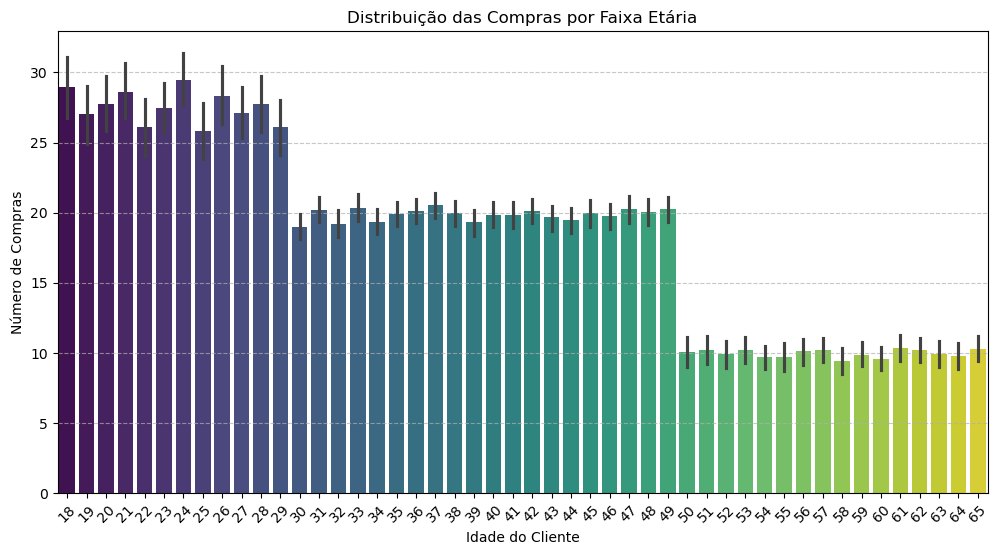

In [14]:
plt.figure(figsize=(12, 6))
sbn.barplot(x=df["Idade_Cliente"], 
            y=df["Histórico_Compra"], 
            palette="viridis")

plt.xlabel("Idade do Cliente")
plt.ylabel("Número de Compras")
plt.title("Distribuição das Compras por Faixa Etária")
plt.xticks(rotation=45)
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

A análise do gráfico revela um padrão na distribuição de compras, onde há um declínio na frequência de compras conforme a idade aumenta. Observamos que a maior concentração de compras ocorre entre jovens de **18 a 29 anos**, enquanto clientes mais velhos, na faixa de **50 a 65 anos**, registram um volume menor de compras.

Uma possível explicação para esse comportamento é que a frequência de compras entre clientes de 50 a 65 anos pode ser maior caso a empresa possua uma loja física, pois esse público tende a preferir compras presenciais. Já entre os mais jovens, que possuem maior familiaridade com compras online, a concentração de compras no e-commerce é significativamente maior.

Esse padrão reforça a ideia de que jovens adultos compram com mais frequência online, enquanto pessoas mais velhas apresentam um volume menor de compras no e-commerce, possivelmente devido à menor familiaridade com tecnologia e plataformas digitais.

Por fim, podemos afirmar que a faixa etária de clientes mais ativa no e-commerce variam de 18 a 29 anos.

### **Insights**

☑ - **Preferências de Compras por Faixa Etária:** 

Jovens Adultos (18 a 29 anos): Esta faixa etária apresenta a maior concentração de compras no e-commerce, indicando uma forte familiaridade e preferência por compras online. Jovens adultos tendem a ser mais adeptos de tecnologia e confortáveis em utilizar plataformas digitais para realizar suas compras. 

Adultos Mais Velhos (50 a 65 anos): A frequência de compras diminui nesta faixa etária. Uma possível explicação é a preferência por compras presenciais, caso a empresa possua uma loja física, devido à menor familiaridade com tecnologia e plataformas digitais.

☑ - **Estratégias de Marketing Personalizadas:** 

Jovens Adultos: Para atrair e reter jovens adultos, é recomendável investir em estratégias de marketing digital, campanhas em redes sociais e aprimoramento da experiência de compra online. Ofertas exclusivas e promoções direcionadas para este grupo podem aumentar o engajamento e as compras.

Adultos Mais Velhos: Para alcançar clientes mais velhos, pode ser útil oferecer suporte adicional, como tutoriais online, atendimento ao cliente personalizado e opções de compra facilitadas. Além disso, campanhas que integrem a experiência online e offline (loja física) podem ser eficazes.

☑ - **Aperfeiçoamento da Experiência do Usuário:** Mobile-Friendly: Garantir que a plataforma de e-commerce seja amigável para dispositivos móveis, já que jovens adultos tendem a usar smartphones para suas compras online.

☑ - **Facilidade de Navegação:** Simplificar a interface do site e do aplicativo para torná-los acessíveis e fáceis de usar, beneficiando tanto jovens quanto clientes mais velhos.

Esses insights ajudam a entender melhor o comportamento de compra dos clientes em diferentes faixas etárias e a direcionar as estratégias de marketing de maneira mais eficaz e personalizada.

## 2. Qual é a distribuição de gênero entre os clientes? Existe diferença no comportamento de compra entre eles? (Boxplot comparando o número de compras por gênero).

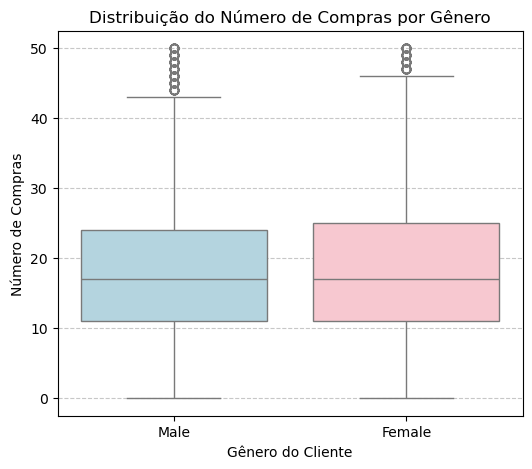

In [15]:
plt.figure(figsize=(6, 5))

sbn.boxplot(x=df["Genero_Cliente"], 
            y=df["Histórico_Compra"], 
            data=df, 
            palette={"Male": "lightblue", "Female": "pink"})

plt.xlabel("Gênero do Cliente")
plt.ylabel("Número de Compras")
plt.title("Distribuição do Número de Compras por Gênero")
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.show()

Podemos entender com o gráfico que **não há diferença significativa** na distribuição do número de compras entre os gêneros, indicando que homens e mulheres possuem um comportamento de compra semelhante no dataset analisado.

Bem, o gênero masculino tem mais outliers comparado com o feminino, mas não representa que o gênero feminino é o público que menos compra no nosso e-commerce. se fôssemos repassar essa informação para a nossa audiência, o certo seria explicar que a distribuição entre ambos é bastante similar, nos levando a expandir o marketing entre ambos os gêneros.

### **Insights**

☑ - **Comportamento de Compra Semelhante:** Homens e mulheres têm um comportamento de compra semelhante em termos de número de compras, sugerindo que as preferências e hábitos de consumo são parecidos entre os gêneros.

☑ - **Outliers no Gênero Masculino:** Observamos que o gênero masculino possui mais outliers comparado ao feminino. Isso significa que, dentro do grupo de homens, há indivíduos que fazem um número de compras significativamente diferente da média, tanto para mais quanto para menos. Apesar desses outliers, isso não implica que o gênero feminino compra menos. É importante não tirar conclusões precipitadas com base nos outliers.

☑ - **Aproveitamento das Preferências:** Aproveitar as semelhanças no comportamento de compra para criar campanhas que enfatizem produtos ou promoções que tenham apelo universal. Isso pode aumentar a eficiência das campanhas e alcançar um público mais amplo.

☑ - **Monitoramento Contínuo:** Continuar monitorando as tendências de compra entre os gêneros para identificar quaisquer mudanças ao longo do tempo. Isso permitirá ajustar as estratégias de marketing conforme necessário para manter a relevância e eficácia.

## 3. Como a faixa de preço dos produtos varia entre diferentes categorias e subcategorias? (Gráfico de colunas para visualizar a variação de preços).

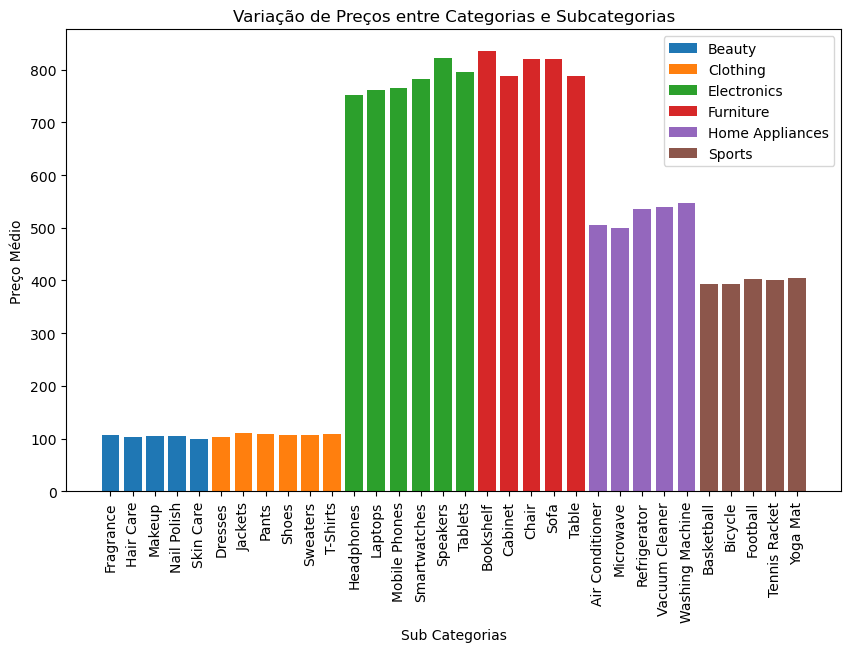

In [16]:
df_selecionado = df[['Categoria', 'Sub_Categoria', 'Preço']]
df_agrupado = df_selecionado.groupby(['Categoria', 'Sub_Categoria']).mean().reset_index()

plt.figure(figsize=(10, 6))
categorias = df_agrupado['Categoria'].unique()
subcategorias = df_agrupado['Sub_Categoria'].unique()
for categoria in categorias:
    df_categoria = df_agrupado[df_agrupado['Categoria'] == categoria]
    plt.bar(df_categoria['Sub_Categoria'], df_categoria['Preço'], label=categoria)

plt.xticks(range(len(subcategorias)), subcategorias, rotation=90)
plt.title('Variação de Preços entre Categorias e Subcategorias')
plt.xlabel('Sub Categorias')
plt.ylabel('Preço Médio')
plt.legend()
plt.show()

Para gerar um gráfico de barras que atendesse aos requisitos da pergunta, foi necessário criar um novo dataframe somente com as colunas que seriam inseridas na minha visualização. Em seguida, fiz um agrupamento das colunas Categoria e Sub Categoria para fazer a media de preço em cada Sub Categoria.

Nesse gráfico de barras, estamos visualizando o comportamento da variância do preço médio entre categoria e subcategoria para saber qual é a categoria com o maior ticket médio, juntamente com as suas subcategorias, identificando quais são os produtos que tem menos venda ou relevância.

### **Insights**

☑ - **Identificação de Produtos Premium:** Podemos identificar quais categorias e subcategorias têm os produtos mais caros, sugerindo produtos premium ou de alta qualidade que atraem clientes dispostos a pagar mais.

☑ - **Ajuste de Estratégias de Preço:** As categorias e subcategorias com preços médios mais baixos podem ser analisadas para ajustar estratégias de preço, promoções ou pacotes de produtos.

☑ - **Segmentação de Mercado:** Entender quais subcategorias dentro de uma categoria têm maior variação de preço pode ajudar na segmentação de mercado, direcionando campanhas de marketing para diferentes grupos de clientes.

☑ - **Identificação de Oportunidades de Crescimento:** Subcategorias com preços médios consistentemente baixos podem indicar áreas onde há potencial para introduzir novos produtos ou melhorar a percepção de valor dos produtos existentes (como por exemplo, produtos de beleza e roupas).

☑ - **Prioridade de Estoque:** Categorias e subcategorias com maior ticket médio podem ser priorizadas em termos de gerenciamento de estoque e investimento para maximizar a rentabilidade.

☑ - **Análise de Desempenho de Produtos:** A análise do gráfico pode revelar quais subcategorias dentro de uma categoria específica estão contribuindo mais para a receita e quais podem precisar de uma revisão de estratégia de vendas.

## 4. Existe correlação entre preço e avaliação dos produtos? (Gráfico de Dispersão para visualizar a relação entre Preço e Nota_Avaliação)

In [17]:
# vamos trazer o dataframe novamente...
display(df)

,ID_Produto,Nome_Produto,Categoria,Sub_Categoria,Preço,Idade_Cliente,Genero_Cliente,Histórico_Compra,Nota_Avaliação,Revisão_Sentimento
0,P0001,Sweater,Clothing,Pants,38.44,58,Male,16,2,Negative
1,P0002,Dining Table,Furniture,Chair,408.46,53,Female,4,5,Very Positive
2,P0003,Skincare Cream,Beauty,Hair Care,22.04,54,Male,7,2,Negative
3,P0004,Skincare Cream,Beauty,Makeup,145.24,27,Female,21,4,Neutral
4,P0005,Bluetooth Speaker,Electronics,Headphones,862.61,44,Female,27,5,Very Positive
...,...,...,...,...,...,...,...,...,...,...
7995,P7996,Yoga Mat,Sports,Football,619.80,32,Male,26,5,Very Positive
7996,P7997,Refrigerator,Home Appliances,Air Conditioner,411.58,44,Male,16,5,Very Positive
7997,P7998,Basketball,Sports,Yoga Mat,761.51,62,Male,12,4,Positive
7998,P7999,Vacuum Cleaner,Home Appliances,Vacuum Cleaner,281.13,60,Male,15,4,Positive


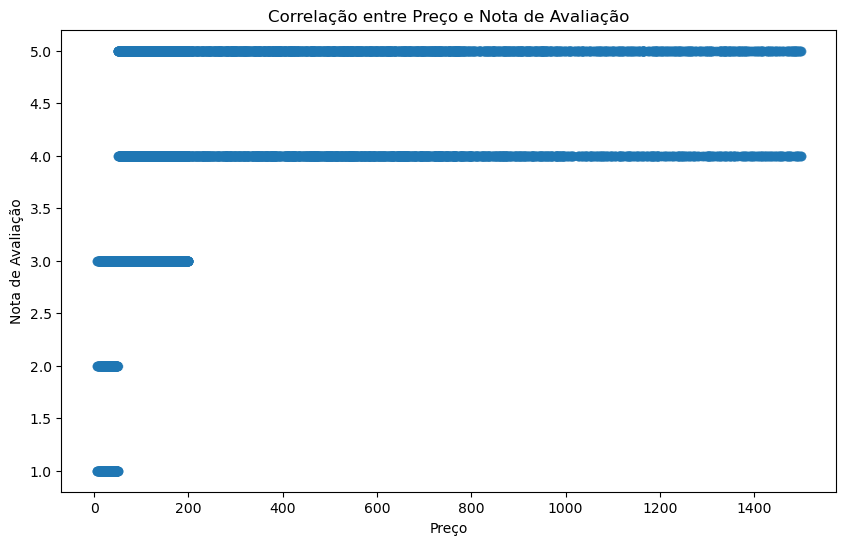

In [18]:
plt.figure(figsize=(10, 6))
plt.scatter(df['Preço'], 
            df['Nota_Avaliação'], 
            alpha=0.5)
plt.title('Correlação entre Preço e Nota de Avaliação')
plt.xlabel('Preço')
plt.ylabel('Nota de Avaliação')
plt.show()

Para entendermos um pouco melhor como funciona esse gráfico de dispersão, vamos primeiro estruturar a informação.

De primeira vista, é um pouco confuso, já que as notas de avaliação que variam de 1 a 3 são direcionadas aos produtos com preços menores que 300, o que contradiz o senso comum de venda, onde o produto com o preço mais baixo tem uma média bem maior que uma nota 1 de avaliação. Entretanto, os produtos com maior preço tem notas maiores de avaliação, o que dá pra dizer que, a correlação entre o preço do produto e nota de avaliação é a seguinte:

**Quanto maior o preço, maior será a nota de avaliação e Quanto menor o preço, menor será a nota de avaliação.**

Vamos olhar para o dataframe em ordem crescente a partir da coluna Nota_Avaliação para entender se os preços são mesmo menores que 200 se a nota da avaliação for 1.

In [19]:
df_4 = df.sort_values(by='Nota_Avaliação', ascending=True)
df_4.head(15)

,ID_Produto,Nome_Produto,Categoria,Sub_Categoria,Preço,Idade_Cliente,Genero_Cliente,Histórico_Compra,Nota_Avaliação,Revisão_Sentimento
3648,P3649,Lipstick,Beauty,Nail Polish,27.60,24,Female,12,1,Negative
7201,P7202,Lipstick,Beauty,Makeup,22.79,33,Male,16,1,Negative
7198,P7199,Dress,Clothing,T-Shirts,43.93,27,Female,8,1,Neutral
5435,P5436,Pants,Clothing,T-Shirts,33.76,59,Female,15,1,Negative
3365,P3366,Soccer Ball,Sports,Bicycle,16.87,37,Male,14,1,Negative
3368,P3369,Lipstick,Beauty,Makeup,37.13,44,Male,13,1,Neutral
3412,P3413,Jeans,Clothing,Jackets,22.13,60,Female,4,1,Neutral
3420,P3421,Lipstick,Beauty,Fragrance,35.25,31,Male,26,1,Neutral
7154,P7155,Foundation,Beauty,Nail Polish,21.02,20,Female,17,1,Negative
7150,P7151,Skincare Cream,Beauty,Fragrance,31.14,60,Male,4,1,Negative


## **Insights**

☑ - **Qualidade x Preço:** Produtos com preços mais altos tendem a ter avaliações melhores. Isso pode indicar que os clientes associam preços mais altos a maior qualidade, e esses produtos estão atendendo ou superando as expectativas dos consumidores. Produtos com preços mais baixos estão recebendo avaliações negativas. Isso pode sugerir que, embora sejam acessíveis, esses produtos não estão atendendo às expectativas dos clientes em termos de qualidade.

☑ - **Expectativas do Cliente:** Há uma discrepância clara entre o preço e a satisfação do cliente, especialmente nos produtos mais baratos. Isso pode ser devido a expectativas não atendidas, onde os clientes esperam uma certa qualidade mesmo em produtos mais acessíveis. Produtos de maior preço e alta avaliação indicam que esses produtos estão superando as expectativas dos clientes e podem ser vistos como investimentos valiosos.

☑ - **Estratégia de Produto:** Pode ser necessário revisar e melhorar a qualidade dos produtos mais baratos para aumentar a satisfação do cliente. Isso pode incluir melhorias nos materiais, funcionalidades e durabilidade dos produtos. Considerar a introdução de produtos com preços intermediários que ainda ofereçam boa qualidade pode ajudar a equilibrar a satisfação do cliente em diferentes faixas de preço.

☑ - **Gestão de Expectativas:** Transparência nas descrições e marketing dos produtos mais baratos pode ajudar a alinhar as expectativas dos clientes com o que realmente é oferecido. Isso pode reduzir a discrepância entre o preço baixo e as avaliações negativas. Oferecer garantias ou políticas de devolução flexíveis pode aumentar a confiança do cliente e melhorar a satisfação, mesmo com produtos de menor preço.

☑ - **Foco no Feedback:** Analisar a Revisão de Sentimento dos clientes sobre os produtos de menor preço pode fornecer informações valiosas em relação aos produtos de Categorias e Sub-Categorias específicas que precisam de melhorias. Utilizar a revisão de sentimento dos produtos de maior preço para promover esses itens pode ajudar a aumentar as vendas e a percepção de qualidade da marca.

## 5. Como os sentimentos das avaliações estão distribuídos entre os produtos? (Gráfico de barras empilhado para comparar a Revisão de Sentimento entre categorias e subcategorias de produtos).

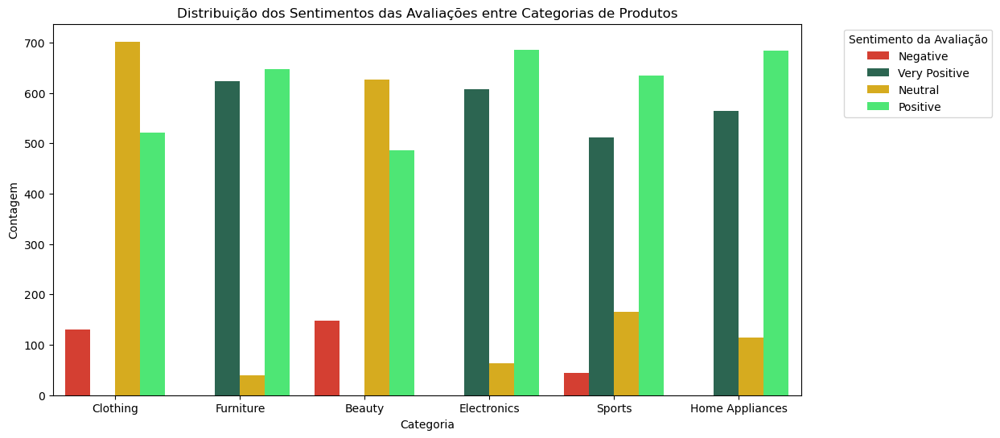

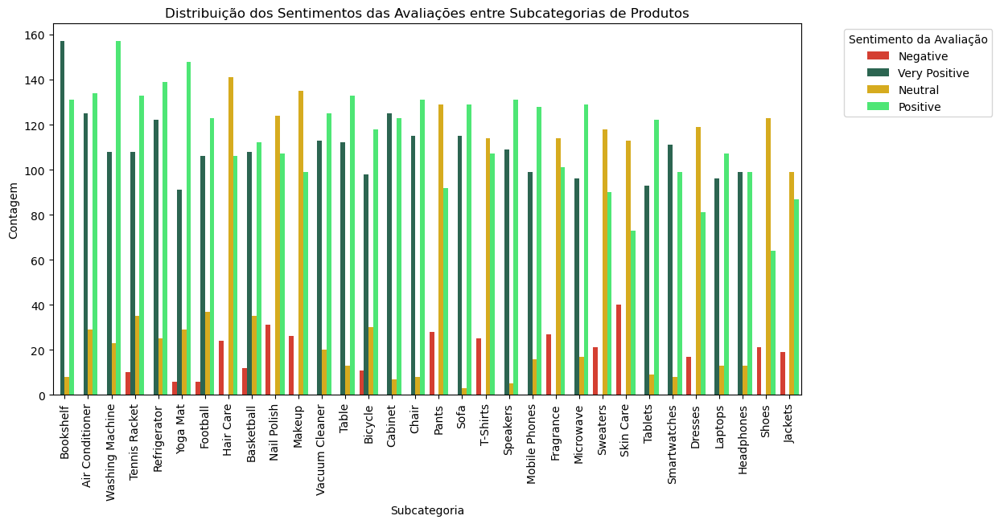

In [20]:
plt.figure(figsize=(12, 6))
palette = {
    'Negative': '#EF2917',       # Vermelho
    'Positive': '#35FF69',       # Verde Claro
    'Neutral': '#F5BB00',        # Amarelo
    'Very Positive': '#226F54'   # Verde Escuro
}

# Gráfico para categorias
sbn.countplot(data=df, 
              x=df['Categoria'], 
              hue=df['Revisão_Sentimento'], 
              palette=palette)
plt.title('Distribuição dos Sentimentos das Avaliações entre Categorias de Produtos')
plt.xlabel('Categoria')
plt.ylabel('Contagem')
plt.legend(title='Sentimento da Avaliação', 
           bbox_to_anchor=(1.05, 1), 
           loc='upper left')
plt.show()

# Gráfico para subcategorias
sub_categoria_counts = df['Sub_Categoria'].value_counts().reset_index()
sub_categoria_counts.columns = ['Sub_Categoria', 'Count']
ordered_sub_categories = sub_categoria_counts['Sub_Categoria'].tolist()
plt.figure(figsize=(12, 6))
sbn.countplot(data=df, 
              x=df['Sub_Categoria'], 
              hue=df['Revisão_Sentimento'], 
              palette=palette, 
              order=ordered_sub_categories,
              dodge=True)
plt.title('Distribuição dos Sentimentos das Avaliações entre Subcategorias de Produtos')
plt.xlabel('Subcategoria')
plt.ylabel('Contagem')
plt.legend(title='Sentimento da Avaliação', 
           bbox_to_anchor=(1.05, 1), 
           loc='upper left')
plt.xticks(rotation=90)
plt.show()

Antes de partir para as análises, vamos explicar o código. Primeiro, definir a minha paleta de cores para distribuir na legenda, levando em consideração que estava trabalhando com o sentimento do cliente em relação ao preço do produto, tentei deixar mais visual com cores mais fortes.

Em seguida, a inserção do gráfico de Distribuição dos Sentimentos das Avaliações entre Categorias de Produtos foi feita de forma básica, já que o requisito era somente apresentar a forma como era distribuído a contagem de avaliação entre 6 variáveis exclusivas. Entretanto, quando estou trabalhando com a coluna de Sub_Categoria, estou lidando com 32 variáveis exclusivas, o que dá a entender que cada categoria tem entre 4 a 6 subcategorias de produtos.

Disso, quando vou distribuir esses dados em um gráfico, as coisas ficam muito "enxutas", mas o objetivo foi responder a pergunta de acordo com o gráfico solicitado, então fiz uma alteração para visualizar a distribuição da contagem com uma ordem, para entender o comportamento dos dados um pouco mais "clean", apesar da escolha do gráfico não ter sido a melhor.

Apesar disso, é possível entender que, no **Gráfico de Distribuição dos Sentimentos das Avaliações entre Categorias**, os produtos imobiliários, eletrônicos e eletrodomésticos não tiveram uma satisfação negativa, mas são os produtos mais bem avaliados do E-Commerce. Se fôssemos escalar uma hierárquia com esses dados, a categoria de produtos mais bem avaliados seria os eletrônicos e o pior seria os produtos de beleza, mas por quê?

Devemos analisar se o atendimento ao cliente está influenciando durante a venda desses produtos, ou também se o marketing dessas categorias tem uma maior concentração de divulgação durante campanhas, nas redes sociais ou dentro do próprio E-Commerce.

Vale lembrar também que nos gráficos anteriores, pode-se obter o insight que os produtos de beleza têm o ticket médio muito inferior comparado com os produtos eletrônicos, o que nos leva a entender que o nosso E-Commerce ou têm um público que buscam mais produtos de tecnologia e relacionados do que produtos de beleza e roupas, ou também a oferta e qualidade ao comercializar os produtos de beleza têm uma baixa concentração, tanto em marketing quanto em qualidade.

Indo para o **Gráfico de Distribuição dos Sentimentos das Avaliações entre Subcategorias**, podemos notar que os produtos: estante, ar condicionado, máquina de lavar roupa, mesa, armário e sofá, são os produtos que têm uma ótima avaliação de sentimento em relação aos seus preços. Já os menos avaliados são: sapatos, cuidados com a pele, unha polonês, maquiagem e calças, o que nos leva para a categoria de Beleza e Roupas.

É necessário entender esse comportamento negativo e inferior dos produtos de beleza em relação às para entender se é qualidade, atendimento, preço ou fatores externos que estão influenciando essa avaliação negativa.

## **Insights**

☑ - **Eletrônicos e Eletrodomésticos como Principais Produtos Bem Avaliados:** Os produtos das categorias de eletrônicos e eletrodomésticos apresentam as melhores avaliações no E-Commerce. Isso sugere que essas categorias têm um excelente desempenho em termos de satisfação do cliente. É crucial continuar investindo em marketing direcionado e ofertas especiais para manter e aumentar a popularidade desses produtos.

☑ - **Desempenho Inferior dos Produtos de Beleza e Roupas:** As categorias de beleza e roupas têm as avaliações de sentimento mais baixas. É fundamental investigar as causas por trás dessa insatisfação, que podem incluir problemas de qualidade, atendimento ao cliente insatisfatório, precificação inadequada ou falta de campanhas de marketing eficazes. Uma análise detalhada pode ajudar a identificar áreas de melhoria para reverter essas avaliações negativas.

☑ - **Impacto do Ticket Médio na Satisfação:** Os produtos de beleza apresentam um ticket médio muito inferior em comparação com os eletrônicos. Isso indica que o público do E-Commerce pode estar mais interessado em produtos de tecnologia, ou que a oferta e qualidade dos produtos de beleza não são suficientemente atraentes. Estratégias de marketing direcionadas para destacar a qualidade e os benefícios dos produtos de beleza, bem como promoções e descontos, podem ajudar a melhorar a percepção e aumentar as vendas.

☑ - **Influência do Atendimento ao Cliente e Marketing nas Avaliações:** É importante considerar se o atendimento ao cliente e as estratégias de marketing estão afetando as avaliações de diferentes categorias. Produtos com melhores avaliações podem estar recebendo um suporte ao cliente mais eficaz ou campanhas de marketing mais direcionadas. Analisar e melhorar a qualidade do atendimento ao cliente e otimizar as campanhas de marketing nas redes sociais e dentro do próprio E-Commerce pode contribuir para uma melhor avaliação de todas as categorias de produtos.

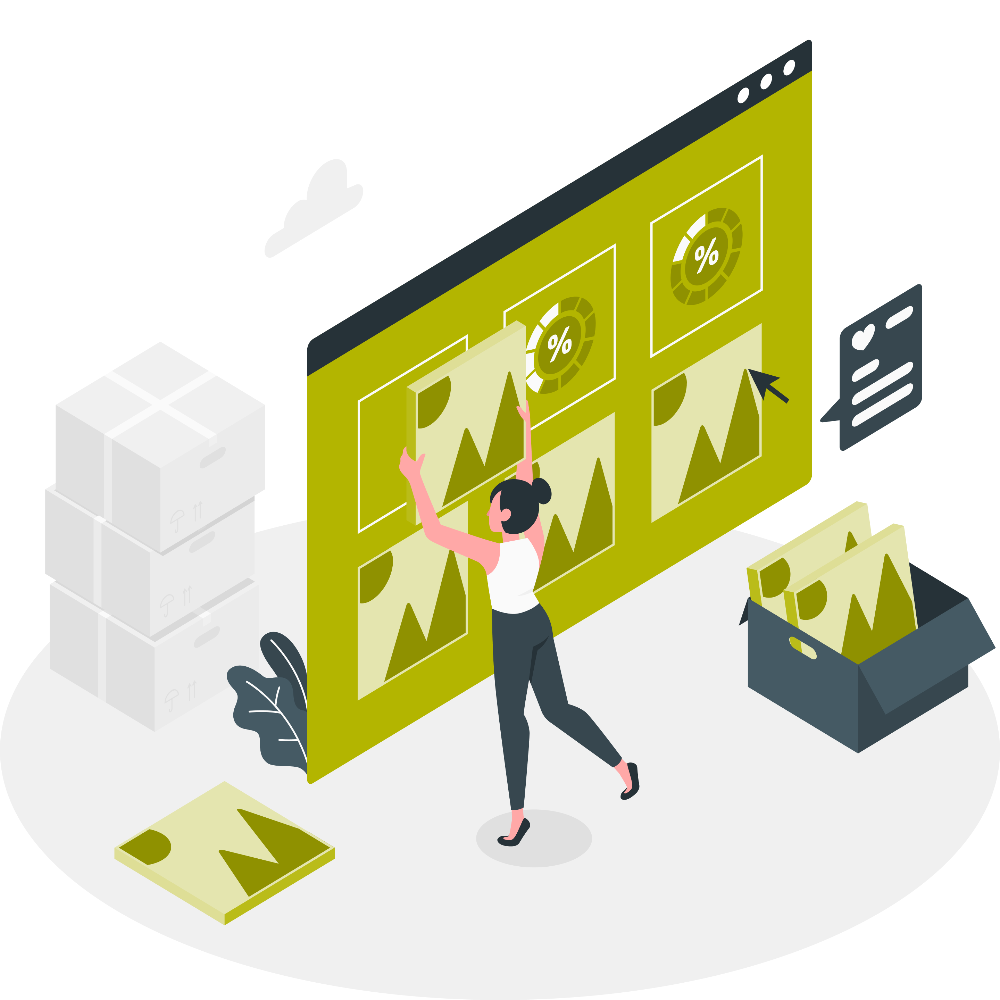

In [21]:
Image(r"image\final_image.png", width=720)

# **Conclusão da Análise Exploratória dos Dados de E-Commerce**

Ao longo da análise exploratória dos dados do E-Commerce, foi possível identificar padrões e tendências valiosas sobre o comportamento dos consumidores, a qualidade percebida dos produtos e as oportunidades de melhoria dentro do marketplace. Cada insight extraído contribui para um entendimento mais profundo sobre como otimizar estratégias de precificação, marketing e gestão de produtos para maximizar a satisfação do cliente e o desempenho do negócio.

Os eletrônicos e eletrodomésticos despontam como os produtos mais bem avaliados, destacando-se pela alta satisfação do cliente. Essa percepção positiva pode ser resultado da **qualidade percebida e do suporte eficiente**, evidenciando a importância de manter estratégias de marketing eficazes e suporte ao cliente diferenciado para essas categorias.

Em contrapartida, os produtos de beleza e roupas apresentam as avaliações mais baixas, sugerindo a necessidade de uma **investigação mais aprofundada sobre fatores como qualidade, atendimento ao cliente e percepção de valor.** O ticket médio mais baixo dessas categorias pode indicar que os consumidores estão menos propensos a investir em tais produtos, possivelmente devido às expectativas não atendidas. Para reverter essa situação, estratégias como melhorias na qualidade, revisão de preços e marketing mais assertivo podem ser implementadas.

O estudo também revelou uma forte **correlação entre preço e satisfação:** produtos mais caros tendem a receber melhores avaliações, enquanto os mais baratos enfrentam desafios na percepção de qualidade. Esse fenômeno destaca a necessidade de gestão das expectativas dos clientes por meio de descrições de produtos mais detalhadas e transparentes, bem como políticas de devolução mais flexíveis.

A análise também apontou oportunidades na **segmentação de mercado.** A identificação de categorias premium e a possibilidade de introduzir produtos de preço intermediário podem equilibrar melhor a percepção de valor, ao mesmo tempo que ampliam as opções disponíveis para diferentes perfis de consumidores. Além disso, categorias com ticket médio elevado devem ser priorizadas na gestão de estoque para garantir a disponibilidade de itens com maior retorno financeiro.

Outro aspecto relevante é o **comportamento de compra entre os gêneros**, que mostrou padrões semelhantes, apesar de haver valores discrepantes no grupo masculino. Isso indica que estratégias de marketing podem ser amplamente aplicadas de maneira unificada, ao mesmo tempo em que o monitoramento contínuo dessas tendências pode trazer novas oportunidades de personalização no futuro.

Por fim, fica evidente a necessidade de um **monitoramento contínuo da satisfação do cliente** por meio da revisão de sentimentos e feedbacks. Essa prática não apenas permite melhorias contínuas na qualidade dos produtos e serviços, mas também possibilita um melhor posicionamento estratégico no mercado.

Com essas informações, o E-Commerce pode não apenas corrigir falhas e melhorar a percepção de valor dos produtos, mas também potencializar suas vendas, fidelizar clientes e fortalecer sua presença no mercado digital.

**Mas e agora?** se eu for entregar esse relatório, dessa mesma forma em que foi estruturada, o meu público não vai conseguir absorver os insights que podem ser aproveitados, e isso é um problema de negócio que precisa ser levado em conta, por isso, vamos estruturar os insights de maneira objetiva para os 3 departamentos que estavam presente na entrega do relatório:

# **Entrega de Resultado para Audiência**

### **Gestores de Produção**

☑ - **Foco na Qualidade dos Produtos:** Implementar processos rigorosos de controle de qualidade para as categorias com avaliações mais baixas. Investigar causas de insatisfação e ajustar o design, material e fabricação dos produtos.

☑ - **Manter a Qualidade em Eletrônicos e Eletrodomésticos:** Continuar investindo na qualidade dos produtos mais bem avaliados, garantindo que as expectativas dos clientes sejam continuamente atendidas.

☑ - **Priorizar Produtos com Ticket Médio Elevado:** Assegurar a disponibilidade de produtos com maior retorno financeiro para atender à demanda.

☑ - **Introdução de Produtos de Preço Intermediário:** Explorar a produção de novos produtos que atendam a uma faixa de preço intermediária para equilibrar a percepção de valor e ampliar a base de clientes.

### **Equipe de Marketing**

☑ - **Categorias Premium:** Identificar e promover produtos como itens de luxo para atrair consumidores que buscam qualidade superior.

☑ - **Marketing Unificado:** Desenvolver campanhas de marketing que possam ser aplicadas de maneira geral, considerando a semelhança nos padrões de compra entre os gêneros, mas monitorando continuamente para ajustes personalizados.

☑ - **Transparência e Descrições Detalhadas:** Melhorar as descrições de produtos para gerenciar expectativas e destacar características de valor agregado.

☑ - **Ajuste de Preços para Produtos de Baixo Ticket Médio:** Revisar e ajustar estratégias de preços para categorias de beleza e roupas, tentando encontrar um equilíbrio que aumente a percepção de valor sem comprometer a competitividade.

### **Equipe de Vendas**

☑ - **Foco em Produtos de Beleza e Roupas:** Treinar a equipe de vendas para oferecer suporte mais eficaz e informado sobre produtos de beleza e roupas, respondendo rapidamente às dúvidas e preocupações dos clientes.

☑ - **Manter Suporte Diferenciado para Eletrônicos e Eletrodomésticos:** Continuar oferecendo suporte de alta qualidade, enfatizando o valor do atendimento pós-venda.

☑ - **Políticas Flexíveis de Devolução:** Implementar políticas que facilitem a devolução de produtos, especialmente para os mais baratos, para aumentar a confiança dos clientes e em sequência, a revisão de sentimento.

☑ - **Monitoramento Contínuo de Feedback:** Estabelecer sistemas para revisar continuamente o feedback dos clientes e usar essas informações para fazer melhorias proativas nos produtos e serviços.